# <오늘 할 것: Detection>

# 1. Detection
- 1-1. Haar-like classifier
    - 1-1-1. 얼굴 검출해보기
    - 1-1-2. 눈 검출해보기
    
- 1-2. Histogram of Oriented Gradients(HOG)
    - 1-1-1. 사람 검출해보기
    - 1-2-2. 실시간으로 검출해보자(동영상)

# 2. ORB를 활용한 디텍션
- 2-1. ORB 복습
- 2-2. ORB를 활용한 디텍션
- 2-3. 책 예제
- 2-4. 함수화하기


# 3. 

# 1. Detection

> 디텍션; 검출; 인식 + 좌표(위치)

> 인식 != 검출

- 인식 == recognition
- 검출 == detection

검출은 **위치, 스케일 및 각도**를 다 하나하나 봐야함
- 한 이미지에서 보통 10만번 검색한다.
- 성능의 문제가 아니라 속도의 문제다.

처음에는 엄청 간단한 분류기
- e.g. Haar like filter; 이마는 밝고 눈은 어둡다
<img src=haar.jpg>
    - 얼굴이 검출되기는 하지만 얼굴이 아닌 것들도 굉장히 많이 섞여서 검출된다.

-> MLP처럼 간단한 분류기 여러개를 앙상블해서 사용하는 방법(soft, hard)

### Cascaded classifier
> 마치 폭포수와 같이 처음에는 굉장히 간단한 소수의 feature만 사용 --> 단계를 거칠 때마다 좀 더 많은 feature를 필터로 사용함으로써 최종적으로 타겟 오브젝트를 검출해내는 방식

- 엄청 많은 계산량에도 불구하고 높은 속도로 타겟을 검출할 수 있다.


## 1-1. Haar-like Classifier

`CascadeClassifier` 생성자 메소드로 클래시파이어 생성
- `cv2.CascadeClassifier('사용할 검출기.xml')`
    - 검출기: 'haarcascade_frontalface_default.xml' 등
    - 여기서 받을 수 있음
        - https://github.com/opencv/opencv/tree/master/data/haarcascades

    - `detectMultiScale` 메소드
        - 리턴값은 좌표들의 리스트
            - (x, y, w, h)의 네 개 값으로 구성된 튜플들의 리스트
        - 자체적으로 흑백 변환을 하기 때문에 이미지 읽어 올 때 따로 흑백처리를 해주지 않아도 된다.
        - `classifier.detectMultiScale(이미지)`



In [66]:
import cv2, numpy as np
import math
import time
import random
from matplotlib import pyplot as plt
%matplotlib inline
from bokeh.plotting import figure
from bokeh.io import output_notebook, show, push_notebook


output_notebook()


def imshow(tit, image) :
    plt.title(tit)    
    if len(image.shape) == 3 :
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    else :
        plt.imshow(image, cmap="gray")
    plt.show()
    
    
def create_win(frames, scale=1.0) :    
    global myImage
    
    all = []
    for f in frames :
        if len(f.shape ) !=  3 : f = cv2.cvtColor(f, cv2.COLOR_GRAY2BGR)
        all.append(f)
    frame = np.vstack(all)
    
    fr=cv2.cvtColor(frame, cv2.COLOR_BGR2RGBA) # because Bokeh expects a RGBA image
    fr=cv2.flip(fr, -1) # because Bokeh flips vertically
    width=fr.shape[1]
    height=fr.shape[0]    

    p = figure(x_range=(0,width), y_range=(0,height), output_backend="webgl", width=int(width*scale), height=int(height*scale))    
    myImage = p.image_rgba(image=[fr], x=0, y=0, dw=width, dh=height)
    show(p, notebook_handle=True)   
    
    
def update_win(frames) :
    
    all = []
    for f in frames :
        if len(f.shape ) !=  3 : f = cv2.cvtColor(f, cv2.COLOR_GRAY2BGR)
        all.append(f)
    frame = np.vstack(all)
    
    fr=cv2.cvtColor(frame, cv2.COLOR_BGR2RGBA)
    fr=cv2.flip(fr, -1)
    fr=cv2.flip(fr, 1)
    myImage.data_source.data['image']=[fr]
    push_notebook()


Loading BokehJS ...

### 1-1-1. 얼굴 검출해보기

In [5]:
#classifier 객체 생성
classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

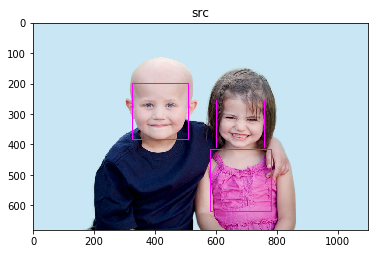

In [6]:
#쉬운 정면 사진
src = cv2.imread('kids.jpg')
faces = classifier.detectMultiScale(src)

for (x, y, w, h) in faces:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)    

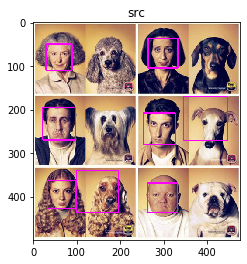

In [8]:
#사람-개 사진
src = cv2.imread('dog.jpg')
faces = classifier.detectMultiScale(src)

for (x, y, w, h) in faces:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)    

사람 얼굴은 모두 검출되나, 개 얼굴도 몇개 검출된다.

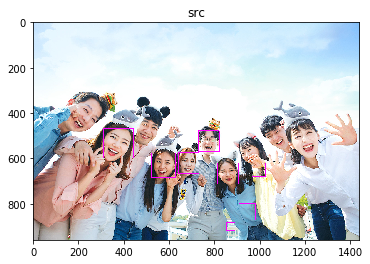

In [9]:
#단체 사진
src = cv2.imread('people.jpg')
faces = classifier.detectMultiScale(src)

for (x, y, w, h) in faces:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)

- 모든 얼굴이 검출되지는 않는다.
    - 얼굴이 좀 가려졌거나 정면 얼굴이 아닌 경우 검출되지 않음
- 얼굴이 아닌 것도 얼굴로 검출된다.

### 1-1-2. 눈 검출해보기

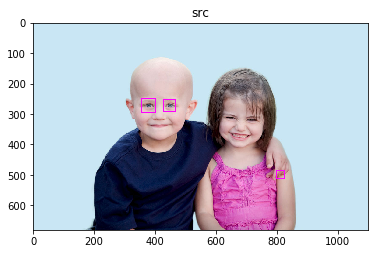

In [10]:
#눈 검출기로 classifier 새로 정의
classifier = cv2.CascadeClassifier('haarcascade_eye.xml')

src = cv2.imread('kids.jpg')

eyes = classifier.detectMultiScale(src)

for (x, y, w, h) in eyes:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)

한 쌍밖에 찾지 못했다.

--> 얼굴 검출 후 눈 검출하는 방식으로 해본다.

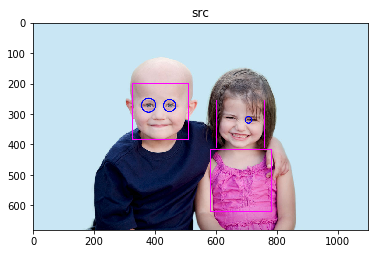

In [18]:
#눈 검출기와 얼굴 검출기를 별도로 정의
face_classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
eye_classifier = cv2.CascadeClassifier('haarcascade_eye.xml')

src = cv2.imread('kids.jpg')

#얼굴을 먼저 검출
faces = face_classifier.detectMultiScale(src)

for (x1, y1, w1, h1) in faces:
        cv2.rectangle(src, (x1, y1), (x1 + w1, y1 + h1), (255, 0, 255), 2)

        #검출된 얼굴로 눈 검출 범위 한정
        faceROI = src[y1:y1 + h1, x1:x1 + w1]    #src[y1:y1 + h1/2, x1:x1 + w1]: h1을 2로 나눠주면 얼굴의 상단부에서만 검출한다(입을 눈으로 검출하는 것을 방지)
        eyes = eye_classifier.detectMultiScale(faceROI)   #눈 검출

        for (x2, y2, w2, h2) in eyes:
            center = (int(x2 + w2 / 2), int(y2 + h2 / 2))
            cv2.circle(faceROI, center, int(w2 / 2), (255, 0, 0), 2, cv2.LINE_AA)

imshow('src', src)  

눈을 하나 더 찾긴 했다.

## 1-2. Histogram of Oriented Gradient(HOG)

> ~~ 방법

- 주로 사람을 검출하는 데 쓴다.

- strong classifier를 구축하는 것이 목표이다.

- `cv2`의 `HOGDescriptor` 메소드를 쓴다.
    - hog = `cv2.HOGDescriptor`
    - `setSVMDetector` 메소드를 활용해서 이미 사람을 검출하도록 학습된 디텍터를 전달한다.
        - hog.`setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())`
        - 따라서 외부 데이터를 따로 다운로드 받아서 읽어오지 않아도 된다.
    - `detectMultiScale` 메소드를 활용해서 사람을 검출한다.
        - hog.`detectMultiScale(이미지)`
        - 리턴값은 두개이다.
            - 검출 결과 좌표
            - 
            

### 1-2-1. 사람 검출해보기

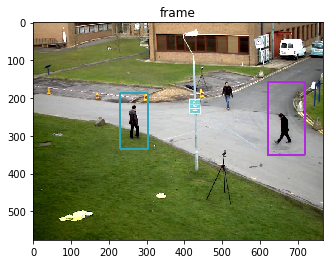

In [20]:
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

frame = cv2.imread("people2.jpg")
detected, _ = hog.detectMultiScale(frame)

for (x, y, w, h) in detected:
        c = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))  #랜덤 색상 지정
        cv2.rectangle(frame, (x, y), (x + w, y + h), c, 3)

imshow('frame', frame)

### 1-2-2. 실시간으로 검출해보자(동영상)

- OpenCV에서 동영상 다루기
    - `VideoCapture` 메소드로 동영상 로드
        - cap = cv2.`VideoCapture(비디오)`
    - `read` 메소드로 동영상 프레임 읽기
        - cap.`read()`
        - 실행할 때마다 한 프레임씩 읽는다.
        - 리턴값은 두개
            - ret: 다음 프레임이 있는지 없는지를 boolean으로 표현
            - frame: nd array 타입의 이미지

In [25]:
#동영상 로드
cap = cv2.VideoCapture('vtest.avi')   #mp4도 가능

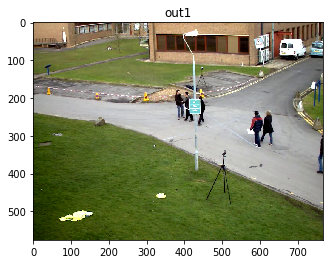

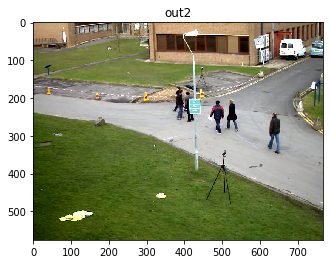

In [27]:
for i in range(20):
    ret, frame = cap.read()   #read 실행시마다 1 프레임씩 읽으므로, 20번째 프레임이 출력된다.
    
imshow('out1', frame)

for i in range(20):
    ret, frame = cap.read()   #40번째 프레임이 출력된다.
    
imshow('out2', frame)

In [29]:
create_win([frame], scale = 0.5)    #위에서 정의한 함수; 아래 셀의 실행 결과가 이 셀 output에서 보임

In [34]:
for i in range(100):
    ret, frame = cap.read()
    update_win([frame])    #이 셀의 실행 결과가 위 셀에서 적용되어 보임

In [59]:
#두개를 합쳐보자
cap = cv2.VideoCapture('vtest.avi')

for i in range(300):
    #프레임 읽어오기
    ret, frame = cap.read()
    
    if i == 0:   #초기화
        create_win([frame], scale = 0.7)
    
    if not ret:
        break
        
    #사람 인식
    detected, _ = hog.detectMultiScale(frame)

    for (x, y, w, h) in detected:
            c = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))  #랜덤 색상 지정
            cv2.rectangle(frame, (x, y), (x + w, y + h), c, 3)
    update_win([frame]) 

In [61]:
#무한 반복으로 만들기

#두개를 합쳐보자
cap = cv2.VideoCapture('vtest.avi')
create_win([frame], scale = 0.7)

while True:
    ret, frame = cap.read()
    
    if not ret:
        cap = cv2.VideoCapture('vtest.avi')
        continue
        
    #사람 인식
    detected, _ = hog.detectMultiScale(frame)

    for (x, y, w, h) in detected:
            c = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))  #랜덤 색상 지정
            cv2.rectangle(frame, (x, y), (x + w, y + h), c, 3)
    update_win([frame]) 

KeyboardInterrupt: 

In [69]:
#얼굴 검출을 실시간으로 해보기

#두개를 합쳐보자
cap = cv2.VideoCapture('video.mp4')
create_win([frame], scale = 0.5)
classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

while True:
    ret, frame = cap.read()
    
    if not ret:
        cap = cv2.VideoCapture('vtest.avi')
        continue
        
    #사람 인식
    faces = classifier.detectMultiScale(frame)

    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 255), 2)
        
    update_win([frame]) 

KeyboardInterrupt: 

꽤 잘한다. 그런데 얼굴이 아닌데 얼굴이라고 검출하는 경우가 많다.

)책 109페이지 모자이크 처리 참고)

Haar Cascade 검출기 --> 성능이 꽤 좋다. 다만 **회전**에는 약하다.

--> 이러한 단점을 보완하기 위해 특징점(orb) 추출을 활용할 수 있다.

# 2. ORB

## 2-1. ORB 복습

In [78]:
orb = cv2.ORB_create()

#matcher 객체 생성
matcher = cv2.BFMatcher_create(cv2.NORM_HAMMING)

images = ['book1.jpg', 'book2.jpg', 'book3.jpg', 'book4.jpg', ] 

database_kp = []
database_desc = []
for name in images :
    img = cv2.imread('./book/' + name, cv2.IMREAD_GRAYSCALE)
    keypoints, desc = orb.detectAndCompute(img, None)
    database_kp.append(keypoints)
    database_desc.append(desc)

In [93]:
test = cv2.imread("./book/book4test.jpg", cv2.IMREAD_GRAYSCALE)
keypoints, desc = orb.detectAndCompute(test, None)

50.86
42.74
51.68
25.38


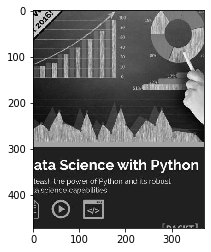

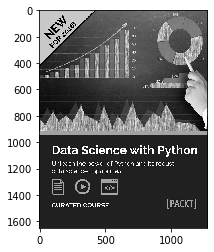

In [94]:
min_distance = 1000
idx = -1
for i in range(len(images)) :   
    matches = matcher.match(desc, database_desc[i])
    matches = sorted(matches, key=lambda x: x.distance)
    good_matches = matches[:50]
    
    distance = 0
    for d  in good_matches :
        distance += d.distance
    distance /= len(good_matches)    
    print(distance)
        
    if  min_distance > distance :
        min_distance = distance
        idx = i

imshow("", test  )
imshow("", cv2.imread('./book/' + images[idx], 0) )

이미지를 회전시켜서 해봐도 제대로 매칭해준다.

In [98]:
test = cv2.imread("rotation_booktest.jpg", cv2.IMREAD_GRAYSCALE)
keypoints, desc = orb.detectAndCompute(test, None)

14.0
56.12
59.2
48.2


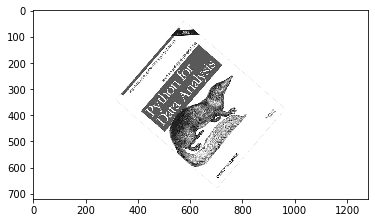

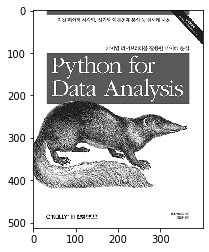

In [100]:
min_distance = 1000
idx = -1
for i in range(len(images)) :   
    matches = matcher.match(desc, database_desc[i])
    matches = sorted(matches, key=lambda x: x.distance)
    good_matches = matches[:50]
    
    distance = 0
    for d  in good_matches :
        distance += d.distance
    distance /= len(good_matches)    
    print(distance)
        
    if  min_distance > distance :
        min_distance = distance
        idx = i

imshow("", test  )
imshow("", cv2.imread('./book/' + images[idx], 0) )

매칭이 아주 잘 된다.

--> 이걸 얼굴 검출에 어떻게 적용할 것인가?

> 서로 다른 두 이미지에서 매칭되는 점(최소 9개)과 매칭 정보를 활용해서 homography 계산, 나머지 점들에 적용
- haar cascade detection이 위치, 각도, 스케일을 계속 바꿔가면서 연산을 수행했다면
- orb를 활용한 디텍션은 소수의 매치 정보만을 가지고 homography를 계산함으로써 오브젝트 검출을 수행한다.

## 2-2. ORB를 활용한 디텍션

순서
1. 원본(이미지1)과 타겟(이미지2)의 특징점 및 특징값 추출 -- `orb.detectAndCompute`
2. 1을 활용해서 원본과 타겟의 매치 정보 계산 -- `matcher.match`
3. 2를 활용해서 H 계산(원본 특징점을 타겟 특징점으로 맵핑하는 행렬)
4. 3을 활용해서 원본의 타겟에서의 좌표 계산
5. 4를 활용해서 타겟에서 오브젝트 검출

3단계) OpenCV의 `findHomography` 메소드를 활용해서 이미지1이 이미지2의 어떤 점으로 맵핑되는지 계산한다.

- `cv2.findHomography(키포인트1, 키포인트2, cv2.RANSAC)`
    - 키포인트1, 키포인트2: orb.detecetAndCompute을 통해 구한 특징점들
    - cv2RANSAC: 
    
- 리턴값은 두 개다.
    - H: 3 X 3 행렬
    - _: 
    
4단계) H를 구하고 나서는 OpenCV의 `perspectiveTransform` 메소드를 활용해서 타겟 이미지에서 오브젝트의 코너 좌표를 계산한다.
- `cv2.perspectiveTransform(이미지1의 코너, H)`

cf. affineTransform: 2D; 늘리고 줄이고 회전하고 뒤집고

perspectiveTransform: 3D; 기울임

- 리턴값은 한 개다.
    - 코너 좌표로 구성된 array
    

In [103]:
src1 = cv2.imread('box.png', cv2.IMREAD_GRAYSCALE)
src2 = cv2.imread('box_in_scene.png', cv2.IMREAD_GRAYSCALE)
    
keypoints1, desc1 = orb.detectAndCompute(src1, None)
keypoints2, desc2 = orb.detectAndCompute(src2, None)

matches = matcher.match(desc1, desc2)
matches = sorted(matches, key=lambda x: x.distance)
good_matches = matches[:50]

In [106]:
#good_match에 포함된 키포인트만 남기기
pts1 = np.array([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2).astype(np.float32)
pts2 = np.array([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2).astype(np.float32)

print(pts1.shape)  # 50,1,2

print(pts1)

(50, 1, 2)
[[[141.00482  155.52002 ]]

 [[139.96802   55.296005]]

 [[134.36931   87.09122 ]]

 [[ 70.84801  167.61601 ]]

 [[143.07841   66.35521 ]]

 [[127.87201   63.936005]]

 [[134.78401  150.33601 ]]

 [[ 89.85601  162.43202 ]]

 [[128.56322   64.28161 ]]

 [[ 64.28161   68.42881 ]]

 [[141.69601  155.52002 ]]

 [[ 88.128006  62.208008]]

 [[143.42401   65.66401 ]]

 [[ 74.30401  103.68001 ]]

 [[126.48962  155.52002 ]]

 [[ 63.936005  69.12001 ]]

 [[ 74.4      176.40001 ]]

 [[126.14401  155.52002 ]]

 [[ 64.28161  145.15202 ]]

 [[134.78401   72.57601 ]]

 [[136.8      132.      ]]

 [[ 74.880005 175.68001 ]]

 [[136.51201  127.87201 ]]

 [[ 65.66401  157.24802 ]]

 [[ 74.64961  116.12161 ]]

 [[ 76.032005 115.77601 ]]

 [[ 76.72321  134.78401 ]]

 [[ 60.480007  77.76001 ]]

 [[145.15201   58.752007]]

 [[136.85762  147.22562 ]]

 [[ 70.50241  118.19521 ]]

 [[ 70.50241  114.04802 ]]

 [[ 66.35521  157.59363 ]]

 [[ 80.870415  64.28161 ]]

 [[122.42538   98.5375  ]]

 [[ 62.20

In [107]:
H, _ = cv2.findHomography(pts1, pts2, cv2.RANSAC)
print(H)

[[ 4.85610150e-01 -1.26423343e-01  1.16639863e+02]
 [ 3.62734153e-02  4.76039278e-01  1.58710108e+02]
 [-1.20390936e-04 -1.08741047e-04  1.00000000e+00]]


In [112]:
(h, w) = src1.shape[:2]

corners1 = np.array([[0, 0], 
                     [0, h-1], 
                     [w-1, h-1], 
                     [w-1, 0]]).reshape(-1, 1, 2).astype(np.float32)

corners2 = cv2.perspectiveTransform(corners1, H)

print(corners1)
print(corners2)

[[[  0.   0.]]

 [[  0. 222.]]

 [[323. 222.]]

 [[323.   0.]]]
[[[116.63986 158.71011]]

 [[ 90.76499 270.93124]]

 [[261.93488 294.67987]]

 [[284.5573  177.32181]]]


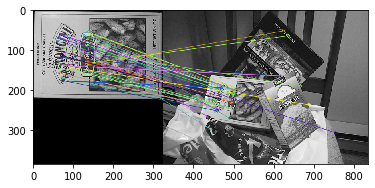

In [125]:
dst = cv2.drawMatches(src1, keypoints1, src2, keypoints2, good_matches, None, flags = cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

imshow("", dst)

In [119]:
corners2

array([[[116.63986, 158.71011]],

       [[ 90.76499, 270.93124]],

       [[261.93488, 294.67987]],

       [[284.5573 , 177.32181]]], dtype=float32)

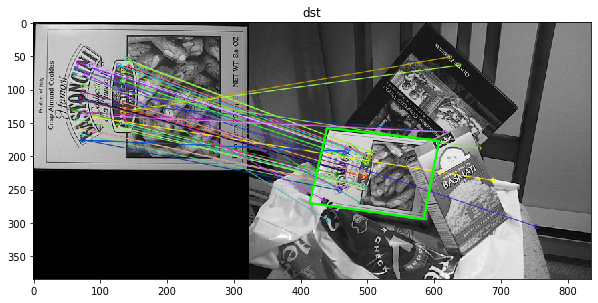

In [126]:
#두 이미지 붙이기

#합친 이미지 중 이미지2 부분에서 오브젝트의 코너 정보를 담은 corners3 변수
corners3 = corners2 + np.float32([w, 0])    #두 이미지를 붙이면 이미지1의 폭인 w만큼 이미지2에서 오브젝트의 위치가 이동하므로

cv2.polylines(dst, [np.int32(corners3)], True, (0, 255, 0), 2, cv2.LINE_AA)   #선 그려줄 때만 int!!!!!

plt.figure(figsize = (10, 20))
imshow('dst', dst)

OpenCV의 `polylines` 메소드
> 좌표의 리스트를 넘겨주면 선을 그어준다.

- `cv2.polines(이미지, [좌표들], True, 색(BGR), 굵기, cv2.LINE_AA)`

## 2-3. 책 예제 

In [210]:
src1 = cv2.imread('./book/book2.jpg', cv2.IMREAD_GRAYSCALE)
src2 = cv2.imread('findbook.jpg', cv2.IMREAD_GRAYSCALE)

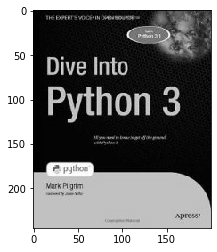

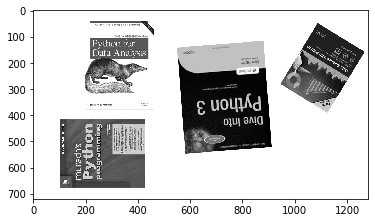

In [211]:
imshow("", src1)
imshow("", src2)

In [212]:
orb = cv2.ORB_create()

kpts1, desc1 = orb.detectAndCompute(src1, None)
kpts2, desc2 = orb.detectAndCompute(src2, None)

matcher = cv2.BFMatcher_create(cv2.NORM_HAMMING)

matches = matcher.match(desc1, desc2)

In [213]:
good_match = matches[:50]

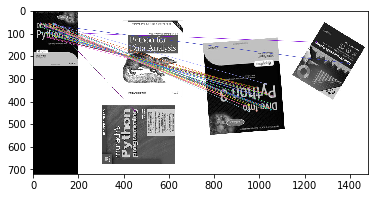

In [214]:
dst = cv2.drawMatches(src1, kpts1, src2, kpts2, good_match, None, flags = cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

imshow("", dst)

In [215]:
#good_match에 포함된 키포인트만 남기기
pts1 = np.array([kpts1[m.queryIdx].pt for m in good_match]).reshape(-1, 1, 2).astype(np.float32)
pts2 = np.array([kpts2[m.trainIdx].pt for m in good_match]).reshape(-1, 1, 2).astype(np.float32)

In [216]:
H, _  = cv2.findHomography(pts1, pts2, cv2.RANSAC)

print(H)

[[-1.69272687e+00 -1.32547419e-01  9.10684776e+02]
 [ 1.12345801e-01 -1.64592967e+00  5.19076711e+02]
 [-5.60153233e-05 -5.98832746e-06  1.00000000e+00]]


In [217]:
h, w = src1.shape

corners1 = np.array([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2).astype(np.float32)

corners2 = cv2.perspectiveTransform(corners1, H)

corners2

array([[[910.68475, 519.0767 ]],

       [[879.6285 , 117.64176]],

       [[548.40497, 141.61215]],

       [[580.3008 , 547.5369 ]]], dtype=float32)

In [218]:
corners2

array([[[910.68475, 519.0767 ]],

       [[879.6285 , 117.64176]],

       [[548.40497, 141.61215]],

       [[580.3008 , 547.5369 ]]], dtype=float32)

In [219]:
np.int32(corners2)

array([[[910, 519]],

       [[879, 117]],

       [[548, 141]],

       [[580, 547]]])

In [223]:
output = src2.copy()
output = cv2.cvtColor(output, cv2.COLOR_GRAY2BGR)

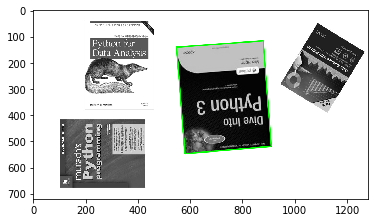

In [224]:
cv2.polylines(output, [np.int32(corners2)], True, (0, 255, 0), 3, cv2.LINE_AA)

imshow("", output)

## 2-4. 함수화하기

In [267]:
def findbook(q, t):     #q, t는 그레이 스케일로 읽은 이미지(ndarray)
    src1 = cv2.imread(q, cv2.IMREAD_GRAYSCALE)
    src2 = cv2.imread(t, cv2.IMREAD_GRAYSCALE)
    
    orb = cv2.ORB_create()
    kpts1, desc1 = orb.detectAndCompute(src1, None)
    kpts2, desc2 = orb.detectAndCompute(src2, None)
    
    matcher = cv2.BFMatcher_create(cv2.NORM_HAMMING)
    matches = matcher.match(desc1, desc2)
    good_matches = sorted(matches, key=lambda x: x.distance)[:50]
    
    pts1 = np.array([kpts1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2).astype(np.float32)
    pts2 = np.array([kpts2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2).astype(np.float32)
    
    H, _ = cv2.findHomography(pts1, pts2, cv2.RANSAC)
    
    h, w = src1.shape
    corners1 = np.array([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2).astype(np.float32)
    corners2 = cv2.perspectiveTransform(corners1, H)
    
    output = cv2.cvtColor(src2.copy(), cv2.COLOR_GRAY2BGR)
    
    cv2.polylines(output, [np.int32(corners2)], True, (0, 255, 0), 5, cv2.LINE_AA)
    
    imshow("output", output)

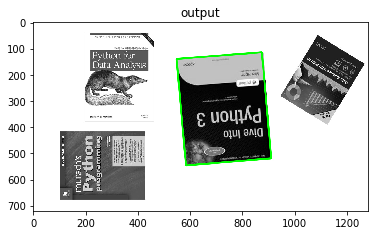

In [273]:
findbook('./book/book2.jpg', 'findbook.jpg')

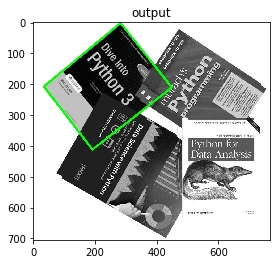

In [277]:
findbook('./book/book2.jpg', 'bookscene.jpg')

잘된다`~`

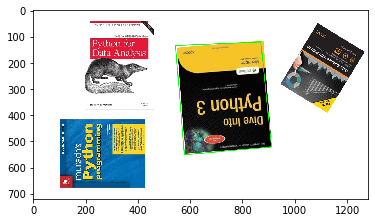

In [281]:
#솔루션
def findBook(query, scene) :     
    src1 = cv2.cvtColor(query, cv2.COLOR_BGR2GRAY)
    src2 = cv2.cvtColor(scene, cv2.COLOR_BGR2GRAY)
    
    keypoints1, desc1 = orb.detectAndCompute(src1, None)
    keypoints2, desc2 = orb.detectAndCompute(src2, None)

    matches = matcher.match(desc1, desc2)
    matches = sorted(matches, key=lambda x: x.distance)
    good_matches = matches[:50]

    pts1 = np.array([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2).astype(np.float32)
    pts2 = np.array([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2).astype(np.float32)

    H, _ = cv2.findHomography(pts1, pts2, cv2.RANSAC)

    (h, w) = src1.shape[:2]
    corners1 = np.array([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2).astype(np.float32)
    corners2 = cv2.perspectiveTransform(corners1, H)
    
    return np.int32(corners2)


q = cv2.imread('./book/book2.jpg')
s = cv2.imread('findbook.jpg')

corner = findBook(q, s)

cv2.polylines(s, [corner], True, (0, 255, 0), 2, cv2.LINE_AA)

imshow("", s)

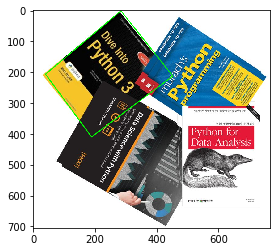

In [284]:
q = cv2.imread('./book/book2.jpg')
s = cv2.imread('bookscene.jpg')

corner = findBook(q, s)

cv2.polylines(s, [corner], True, (0, 255, 0), 2, cv2.LINE_AA)

imshow("", s)

근데 둘다 book2만 잘된다.